In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import RFE
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import GradientBoostingRegressor

# Loading and preprocessing data

In [2]:
data_frame = pd.read_csv('Electricity BILL.csv')
data_frame

,Building_Type,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Building_Status,Maintenance_Priority,Energy_Per_SqM,Number_of_Residents,Electricity_Bill
0,Residential,1989,12,50.000000,477.681762,48.417266,81.814110,13.780635,6,0,7.211768,Under Maintenance,High,174.835708,360,16408.008770
1,Institutional,1980,6,225.759107,200.000000,46.405516,45.109000,10.177771,10,0,34.139492,Under Maintenance,High,143.086785,91,15230.425070
2,Industrial,2006,10,98.755927,200.000000,17.247585,48.526225,27.757026,2,1,6.224612,Operational,Medium,182.384427,115,8117.632795
3,Commercial,1985,1,68.470692,200.000000,57.719480,76.335921,1.519812,2,0,5.327398,Closed,Low,226.151493,159,13030.707160
4,Industrial,2006,12,50.000000,347.093644,26.936862,96.511319,1.874753,19,0,7.060854,Closed,Medium,138.292331,258,25848.853740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,Residential,1985,10,147.613313,677.914745,29.602927,84.905237,51.340186,9,0,8.304416,Operational,Low,88.802987,371,10955.774250
1246,Commercial,2007,5,50.000000,861.042961,23.576263,97.506525,100.000000,5,0,5.810473,Closed,Low,151.704173,289,17280.830640
1247,Commercial,1990,1,50.000000,1500.000000,46.190167,94.054395,13.554989,1,0,6.761967,Under Maintenance,Medium,111.501338,237,11618.171220
1248,Institutional,2021,6,250.000000,1500.000000,55.807260,67.780207,13.554989,6,0,14.147058,Operational,Medium,161.689296,196,11732.247650


# (a) EDA 

### PairPlot
- Pairplot is a great way to visualize the relationship between all the features in the dataset.
- Diagonal plots are univariate plots and the rest are bivariate plots.

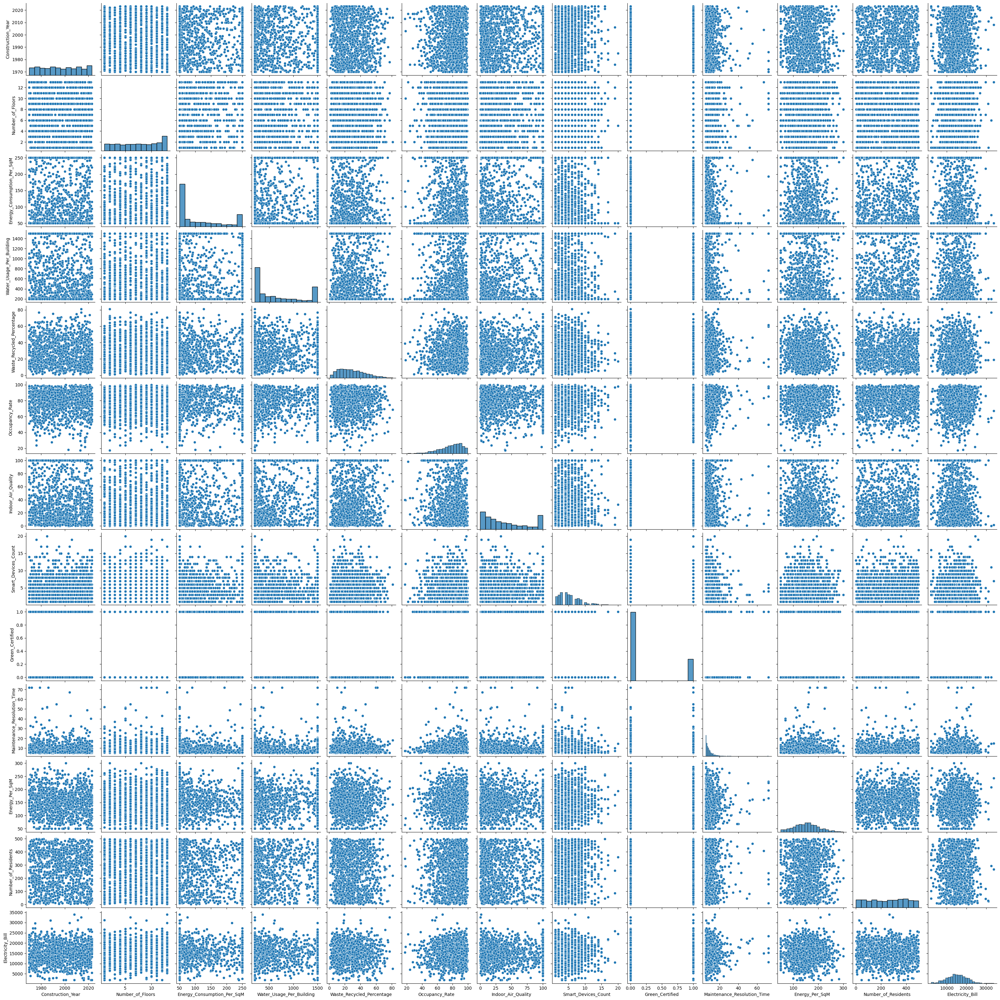

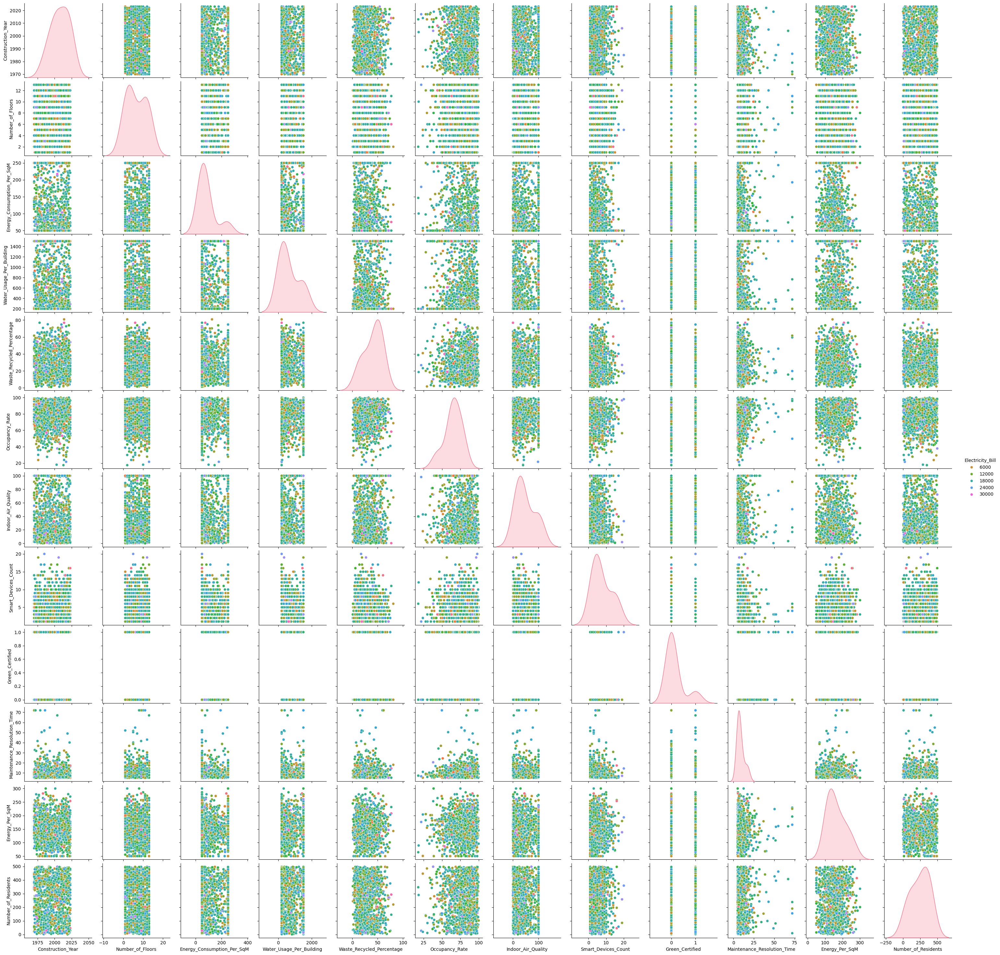

In [3]:
# Perform EDA by creating pair plots, box plots, violin plots, count plots for categorical features, and a correlation heatmap
# Pair plot
# plt.figsize=(20,10)
sns.pairplot(data_frame)
sns.pairplot(data_frame, hue = 'Electricity_Bill', palette = 'husl')
plt.show()

In [4]:
numeric_df = data_frame.select_dtypes(include=[np.number])
categorical_df = data_frame.select_dtypes(include=[object])
numeric_df1 = numeric_df.drop('Green_Certified', axis=1)
data_frame_tmp = data_frame.copy()
data_frame_tmp['Green_Certified'] = data_frame_tmp['Green_Certified'].astype(str)
categorical_df1 = data_frame_tmp.select_dtypes(include=['object'])

### Boxplot
- Boxplot is a great way to visualize the distribution of the data.
- It shows the median, quartiles, and outliers.
- It displays the following:
    - Median (Q2/50th Percentile): the middle value of the dataset.
    - First quartile (Q1/25th Percentile): the middle number between the smallest number (not the “minimum”) and the median of the dataset.
    - Third quartile (Q3/75th Percentile): the middle value between the median and the highest value (not the “maximum”) of the dataset.
    - Interquartile range (IQR): 25th to the 75th percentile.
    - Whiskers (shown in blue)
    - Outliers (shown as green points)

In [39]:
def calculate_boxplot_stats(data_frame, column):
    q1 = data_frame[column].quantile(0.25)
    q2 = data_frame[column].quantile(0.5)
    q3 = data_frame[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return q1, q2, q3, iqr, lower_bound, upper_bound

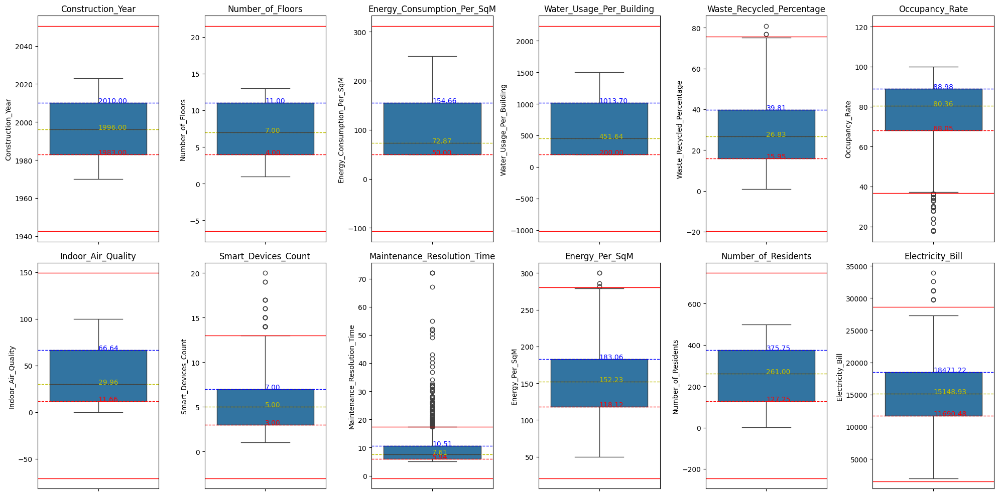

In [44]:
# Box plot
plt.figure(figsize=(20, 10))
for i, column in enumerate(numeric_df1.columns, 1):
    plt.subplot(2, 6, i)
    sns.boxplot(y=column, data=data_frame, orient='v')

    stats = calculate_boxplot_stats(data_frame, column)

    plt.text(0, stats[0], f'{stats[0]:.2f}', color='r')
    plt.text(0, stats[1], f'{stats[1]:.2f}', color='y')
    plt.text(0, stats[2], f'{stats[2]:.2f}', color='b')


    plt.axhline(stats[0], color='r', linestyle='--', linewidth=1)
    plt.axhline(stats[1], color='y', linestyle='--', linewidth=1)
    plt.axhline(stats[2], color='b', linestyle='--', linewidth=1)
    plt.axhline(stats[4], color='r', linestyle='-', linewidth=1)
    plt.axhline(stats[5], color='r', linestyle='-', linewidth=1)

    plt.title(column)

plt.tight_layout()
plt.show()


### Inferences from the Boxplots

1. Maintenance_Resolution_Time:
    - Very concentrated spread indicating that most of the data is closely clustered together.
    - contains the highest number of outliers indicating presence of extreme cases.

2. Construction_Year and Number_of_Residents:
    - Symmetrical distribution of data with no outliers can be noticed for both cases since the whiskers are of equal length.
    - Presence of no outliers indicate that most buildings were constructed in the same year and have typically the same number of residents.

3. Wasted_Recycled_Percentage, Energy_per_SqM and Electricity_Bill:
    - Almost symmetrical distribution of data with few outliers can be noticed for all three cases.
    - This indicates that although most houses use same amount of energy, electricty and generate same amount of waste, there are few houses that are outliers and use more energy, electricity and generate more waste.

4. Energy Consumption per Sqm, Water Usage Per Building, and Indoor Air Quality:
    - Positive skewness that is the upper whisker is longer than the lower whisker and median is closer to the lower quartile.
    - This indicates that although most values lie in the lower range, there are few houses that use more energy, water and have poor indoor air quality and stretch the whisker upwards.

5. Occupancy_Rate:
    - Large number of outliers below the lower whisker indicating that a large number of houses have a low occupancy rate.

### Violinplot
- Violinplot is a combination of a boxplot and a KDE plot.
- It shows the distribution of the data.
- It displays the following:
    - Median (Q2/50th Percentile): the middle value of the dataset.
    - First quartile (Q1/25th Percentile): the middle number between the smallest number (not the “minimum”) and the median of the dataset.
    - Third quartile (Q3/75th Percentile): the middle value between the median and the highest value (not the “maximum”) of the dataset.
    - Interquartile range (IQR): 25th to the 75th percentile.
    - Whiskers (shown in blue)
    - Outliers (shown as green points)
    - KDE plot (shown in orange)

- White centered dot: median
- Thick black line: interquartile range
- Thin black line: 95% confidence interval
- Line boundary: distribution of the data

<Figure size 2000x1000 with 0 Axes>

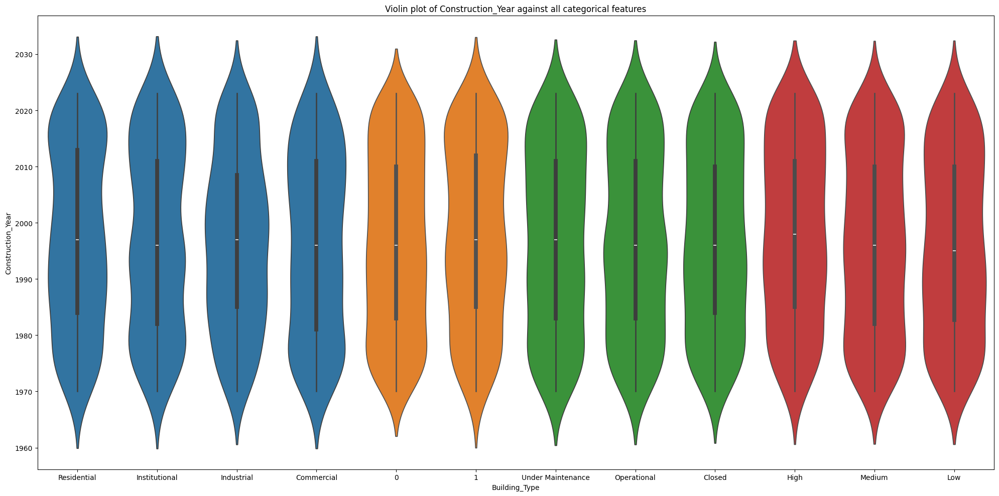

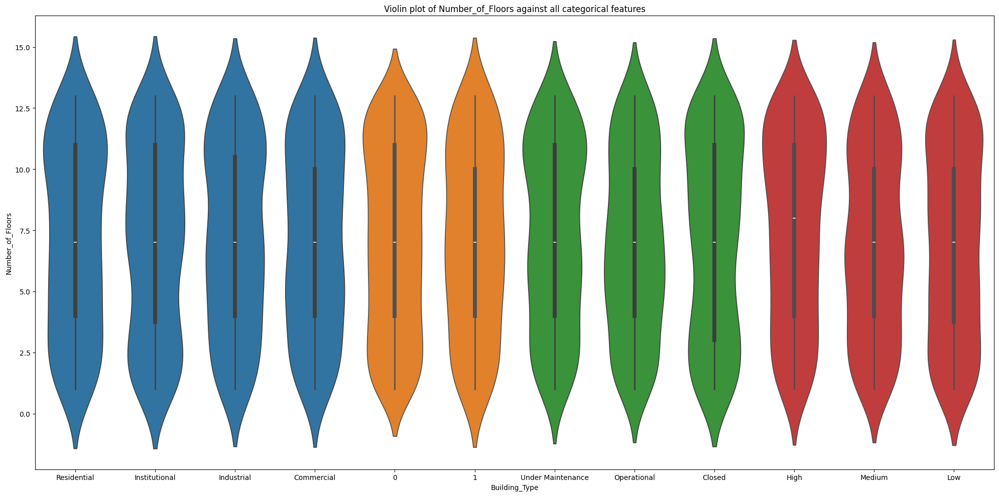

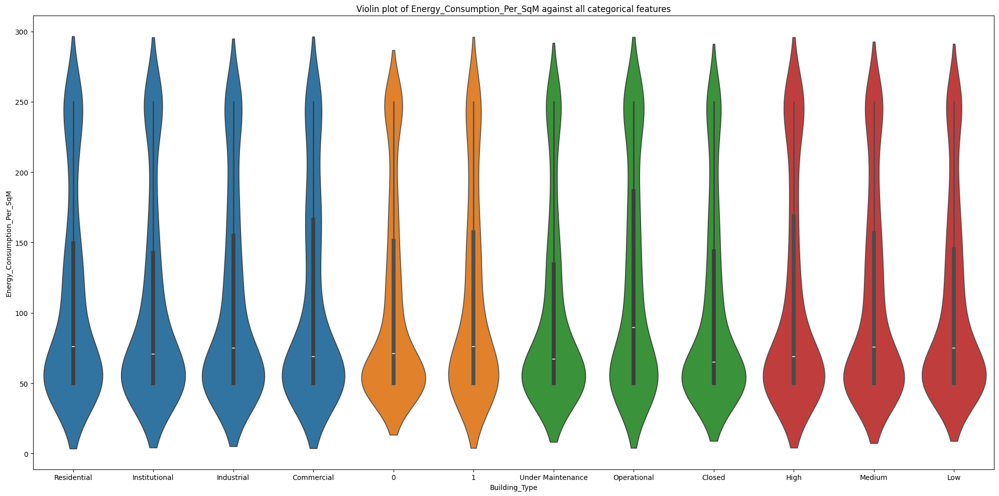

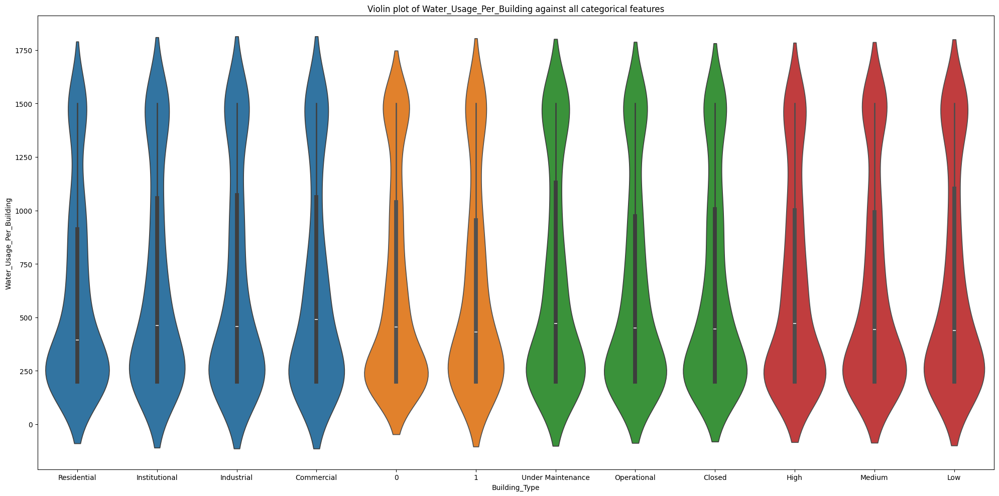

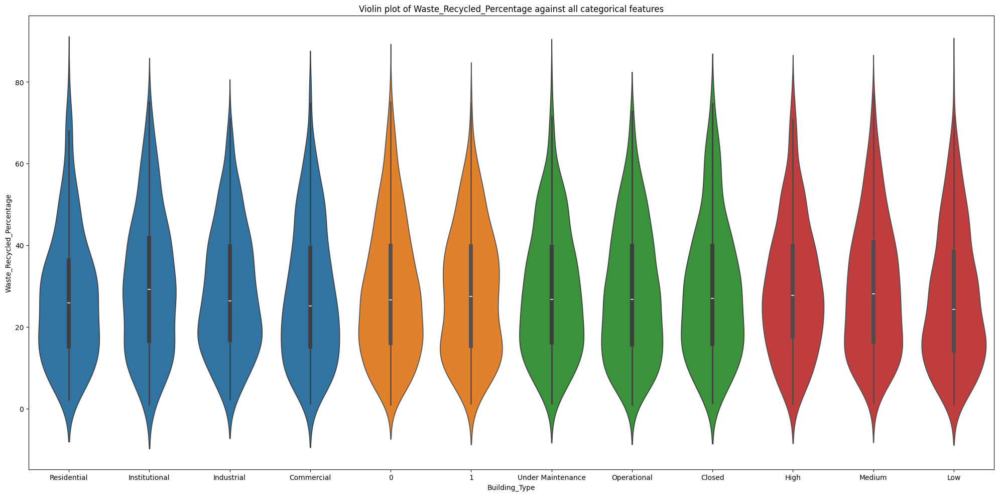

...

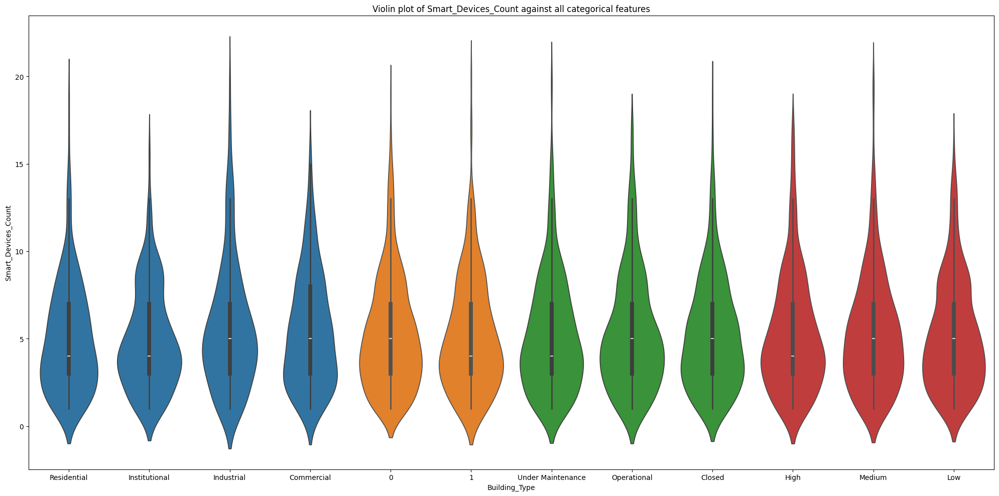

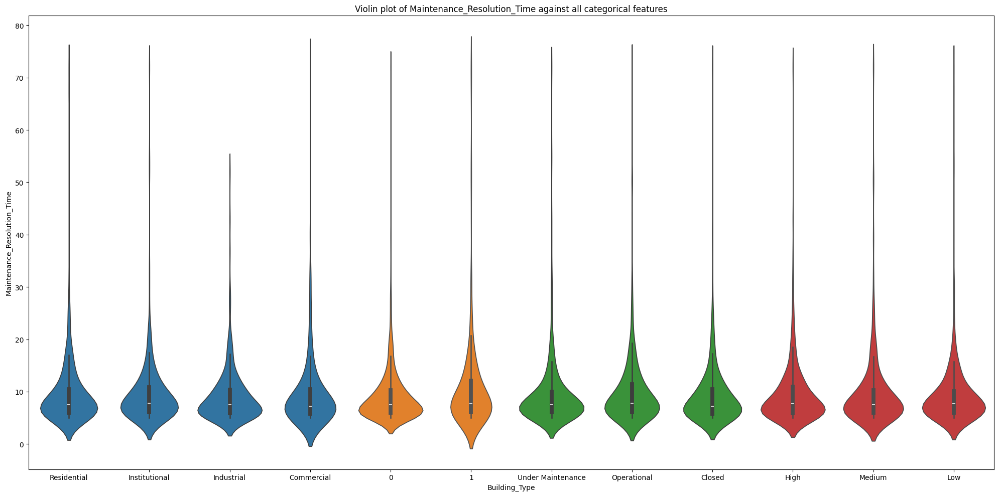

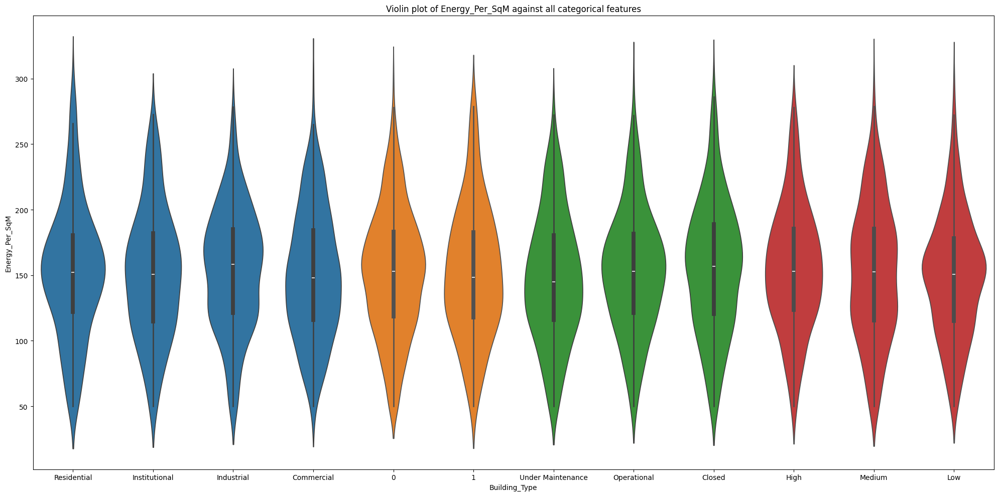

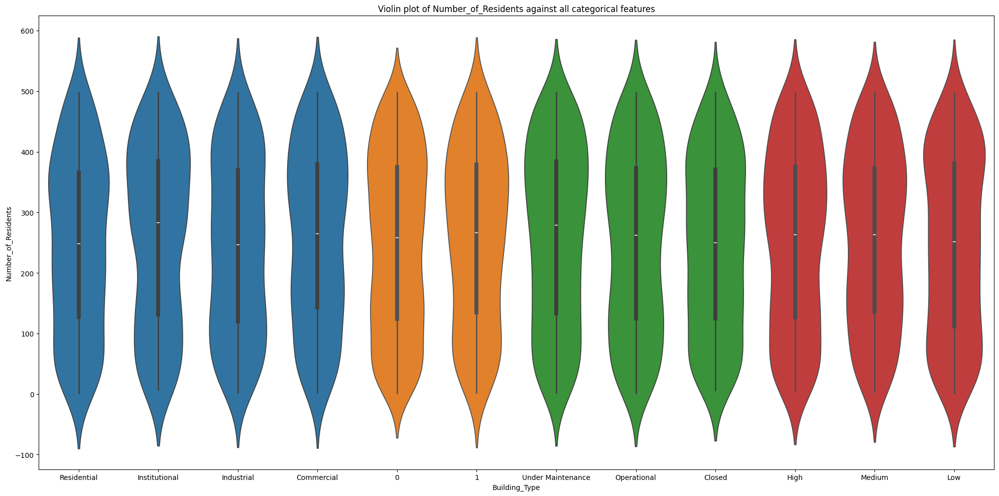

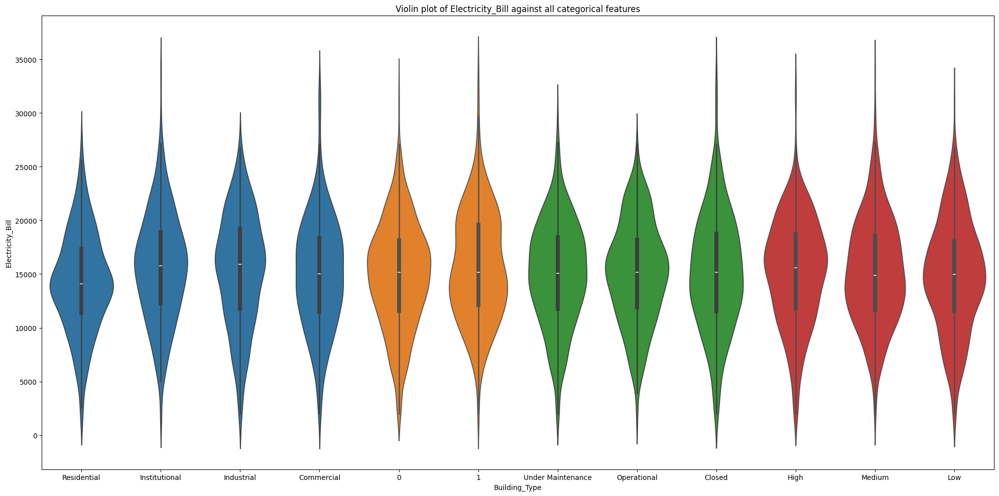

In [6]:
# Violin plot
categorical_col = 'Electricity_Bill'

plt.figure(figsize=(20, 10))

for num_column in numeric_df1.columns:
    plt.figure(figsize=(20, 10))
    for cat_column in categorical_df1.columns:
        sns.violinplot(x=cat_column, y=num_column, data=data_frame, orient='v')
    plt.title(f'Violin plot of {num_column} against all categorical features')
    plt.tight_layout()
    plt.show()

### Inferences from the Violinplot of Electricity_Bill against all the categorical features
This violin plot shows the distribution of the electricity bills across different categorical features. The wider sections of the violin plot indicate a higher density of data points, while the narrower sections represent lower density. Here's an inference for each categorical feature based on the plot:

1. Building Type (Residential, Institutional, Industrial, Commercial):
   - Residential and Institutional buildings have a wide spread of electricity bills, with many bills clustering around the 15,000–20,000 range.
   - Industrial and Commercial buildings show a similar spread but appear to have higher upper limits, with some bills reaching over 30,000, though the median values remain consistent across categories. This suggests that industrial and commercial buildings may have more variability in their electricity usage compared to residential and institutional buildings.

2. Green certified (0 and 1):
   - The categories 0 and 1 likely correspond to building being green_certified or not.
   - Both categories show relatively high density around 15,000–20,000, with category 1 possibly having a slightly higher range. This suggests that both categories result in similar electricity usage patterns.

3. Building Condition (Under Maintenance, Operational, Closed):
   - Buildings Under Maintenance have a lower spread of electricity bills, likely due to lower energy usage during maintenance periods.
   - Operational buildings show a higher spread, with bills ranging from near 0 to over 35,000, indicating more active energy usage.
   - Closed buildings have a smaller spread, with most bills clustering around 15,000, but a few outliers suggesting some energy usage even when closed.

4. Energy Efficiency (High, Medium, Low):
   - High-efficiency buildings have a narrower spread, clustering mostly between 10,000 and 20,000, indicating more consistent and likely lower electricity usage.
   - Medium and Low-efficiency buildings have a wider spread, especially for Low-efficiency buildings, where there is a greater chance of higher electricity bills, suggesting that lower efficiency correlates with higher energy consumption.

### Countplot
- Countplot is a great way to visualize the count of each category in a categorical feature.
- It displays the count of each category in a bar plot.

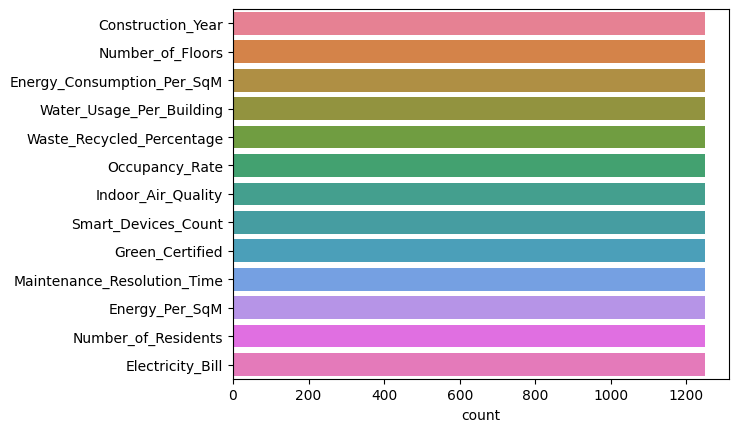

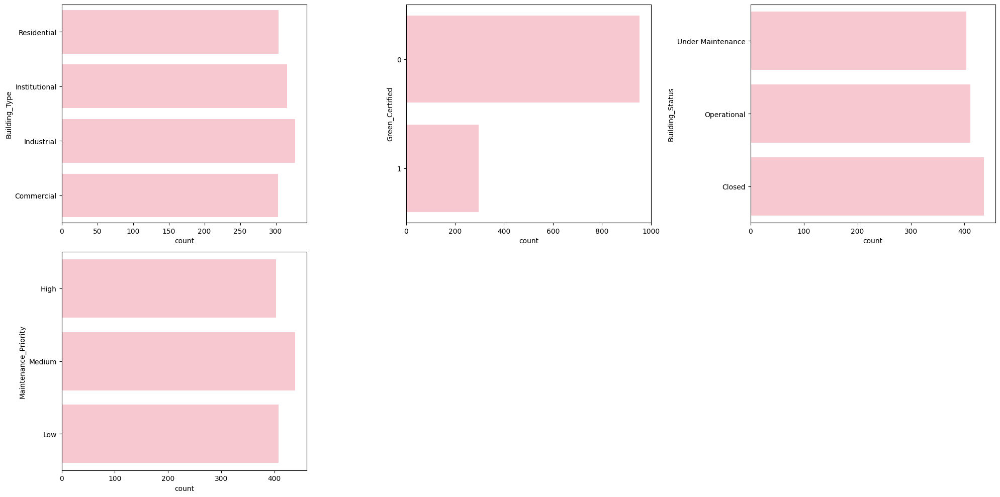

In [7]:
# Count plot
sns.countplot(data_frame, orient='h')

plt.figure(figsize=(20, 10))

for i, column in enumerate(categorical_df1.columns):
    plt.subplot(2, 3, i+1)
    sns.countplot(y=column, data=data_frame_tmp, color= 'pink')

plt.tight_layout()
plt.show()

### Inferences from the Countplot of the categorical features
1. Only a small fraction of buildings are Green Certified even though such houses are more sustainable.
2. Most buildings are either closed or under maintenance.

### Correlation HeatMap
- Correlation heatmap is used to visualize the correlation between all the features in the dataset with colour-coding.
- The correlation coefficient ranges from -1 to 1.
- The closer the correlation coefficient is to 1, the stronger the positive correlation.
- The closer the correlation coefficient is to -1, the stronger the negative correlation.
- The closer the correlation coefficient is to 0, the weaker the correlation.
- The diagonal of the heatmap is always 1 because it represents the correlation of a feature with itself.

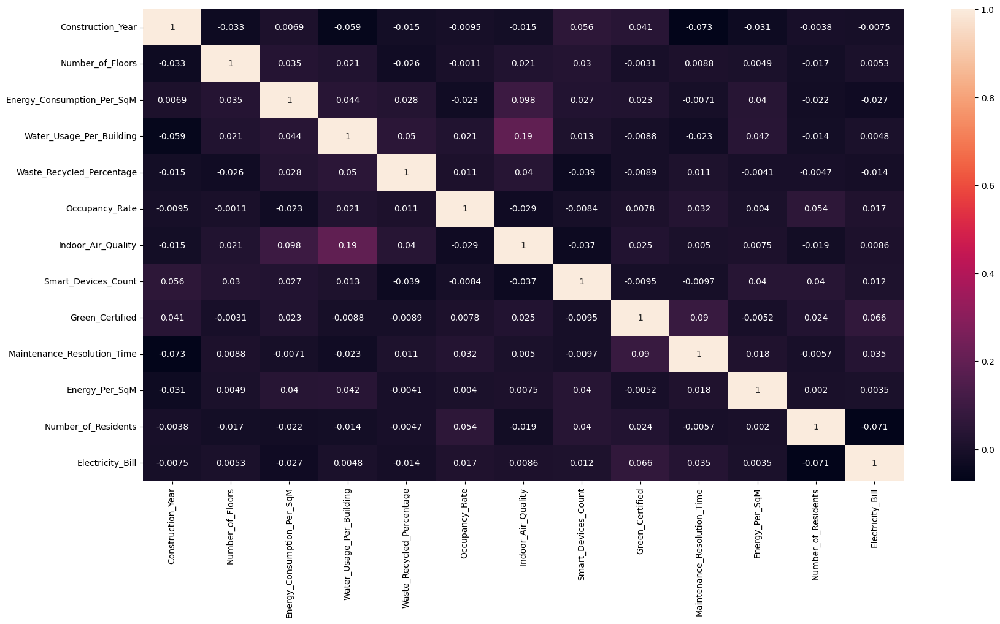

In [8]:
# Correlation heatmap

plt.figure(figsize=(20, 10))
sns.heatmap(numeric_df.corr(), annot=True)
plt.show()

### Inferences from the Correlation HeatMap
1. Energy_Consumption_per_SqM and Water_Usage_per_Building both have a strong positive correlation with Indoor_Air_Quality.
2. Maintenance_Resolution_Time and Electricity_Bill both have a strong positive correlation with Green_certified buildings.
3. Energy_Consumption_per_SqM has a strong negative correlation with Occupancy_Rate.
4. Constructio_year and Water_Usage_per_Building have a strong negative correlation.
5. Number_of_Residents and Electricity_Bill have a strong negative correlation.


# (b) UMAP
UMAP is a dimensionality reduction technique that is used to visualize high-dimensional data in a lower-dimensional space. It is similar to t-SNE but is faster and scales better to large datasets. UMAP is used to visualize the data in 2D space.

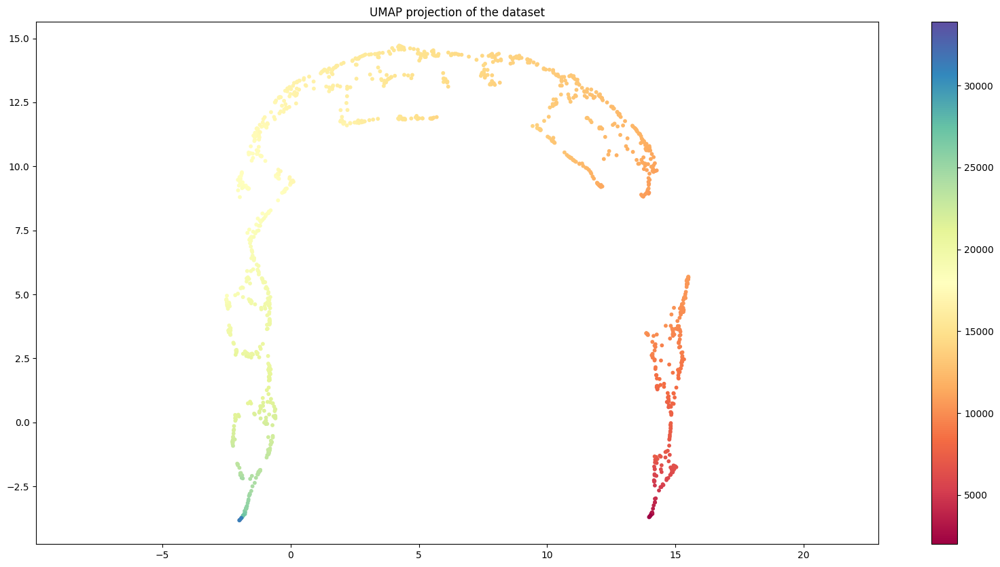

In [9]:
# Use the Uniform Manifold Approximation and Projection (UMAP) algorithm to reduce the data dimensions to 2 and plot the resulting data as a scatter plot.
reducer = umap.UMAP(n_components=2)
embedding = reducer.fit_transform(numeric_df)
plt.figure(figsize=(20, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], c = numeric_df['Electricity_Bill'], cmap = 'Spectral', s = 10)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar()
plt.title('UMAP projection of the dataset with Electricity_Bill labels')

plt.show()

### Inferences from the UMAP plot of unscaled data
- We see a large number of small clusters in the UMAP plot.
- The data points show that they are not linearly separable, hence the following linear regression methods will show poor performance on this dataset.
- Some clusters are dense and some are sparse, indicating that the data is not uniformly distributed.

# (c) Preprocessing data and applying Linear Regression

### Min-Max Scaling for numerical features and label encoding for categorical features

In [10]:
# Perform the necessary pre-processing steps, including handling missing values and normalizing numerical features. For categorical features, use LabelEncoding.

# data_frame.dropna(inplace=True)

scaler = MinMaxScaler()
encoder = LabelEncoder()

X = data_frame.drop(columns=['Electricity_Bill'])
y = data_frame['Electricity_Bill']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train_num = X_train.select_dtypes(include=[np.number])
X_train_cat = X_train.drop(columns=X_train_num.columns)

X_test_num = X_test.select_dtypes(include=[np.number])
X_test_cat = X_test.drop(columns=X_test_num.columns)


X_train_scaled_num = pd.DataFrame(scaler.fit_transform(X_train_num), columns=X_train_num.columns)

# X_train_scaled_cat = X_train_cat.apply(lambda col: encoder.fit_transform(col.astype(str)))

X_cat_combined = pd.concat([X_train_cat, X_test_cat])

X_cat_combined_encoded = X_cat_combined.apply(lambda col: encoder.fit_transform(col.astype(str)))

X_train_scaled_cat = X_cat_combined_encoded.loc[X_train_cat.index]
X_test_scaled_cat = X_cat_combined_encoded.loc[X_test_cat.index]


X_train_scaled_num.reset_index(drop=True, inplace=True)
X_train_scaled_cat.reset_index(drop=True, inplace=True)


X_train_scaled = pd.concat([X_train_scaled_num, X_train_scaled_cat], axis=1)


# print(X_test_num)
# print(X_test_cat)

X_test_scaled_num = pd.DataFrame(scaler.transform(X_test_num), columns=X_test_num.columns)

# X_test_scaled_cat = X_test_cat.apply(lambda col: encoder.transform(col.astype(str)))

X_test_scaled_num.reset_index(drop=True, inplace=True)
X_test_scaled_cat.reset_index(drop=True, inplace=True)

X_test_scaled = pd.concat([X_test_scaled_num, X_test_scaled_cat], axis=1)

data_frame_scaled = pd.concat([X_train_scaled, y_train], axis=1)

In [11]:
X_train

,Building_Type,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Building_Status,Maintenance_Priority,Energy_Per_SqM,Number_of_Residents
1194,Residential,1994,12,50.000000,580.606931,43.094641,80.259802,6.102523,5,0,5.663658,Operational,Low,70.350313,464
911,Institutional,1984,13,50.000000,970.030615,15.275873,60.502829,1.992007,3,0,5.749664,Operational,Low,160.957516,82
422,Institutional,2005,4,50.000000,1500.000000,36.814778,90.148878,8.790387,7,1,7.150327,Under Maintenance,Low,137.551793,329
670,Residential,1974,1,50.000000,1189.472269,11.617533,74.123302,48.316881,3,1,11.586360,Under Maintenance,Medium,212.304260,383
931,Commercial,1984,11,250.000000,239.075260,15.539133,59.488492,8.189832,7,1,6.952755,Under Maintenance,High,244.057853,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,Commercial,2017,13,250.000000,200.000000,16.889496,96.136080,1.632130,5,0,8.499914,Operational,Medium,141.368635,49
1095,Commercial,2013,6,50.000000,1104.346639,5.401686,62.055646,48.852017,4,0,17.705763,Operational,Low,145.964171,326
1130,Commercial,1986,11,192.788337,1500.000000,19.730502,49.788178,50.534211,4,1,72.000000,Operational,High,166.067861,155
860,Industrial,2015,2,224.100389,200.000000,45.220014,95.966973,69.016964,4,0,8.081216,Closed,High,160.146151,71


In [12]:
X_train_scaled_num

,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Energy_Per_SqM,Number_of_Residents
0,0.452830,0.916667,0.000000,0.292775,0.527471,0.761137,0.060281,0.222222,0.0,0.009899,0.086227,0.931590
1,0.264151,1.000000,0.000000,0.592331,0.179643,0.521143,0.019143,0.111111,0.0,0.011183,0.470142,0.162978
2,0.660377,0.250000,0.000000,1.000000,0.448951,0.881262,0.087181,0.333333,1.0,0.032088,0.370969,0.659960
3,0.075472,0.000000,0.000000,0.761133,0.133901,0.686595,0.482759,0.111111,1.0,0.098298,0.687705,0.768612
4,0.264151,0.833333,1.000000,0.030058,0.182934,0.508822,0.081170,0.333333,1.0,0.029140,0.822250,0.074447
...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.886792,1.000000,1.000000,0.000000,0.199818,0.953991,0.015541,0.222222,0.0,0.052232,0.387141,0.096579
996,0.811321,0.416667,0.000000,0.695651,0.056182,0.540006,0.488115,0.166667,0.0,0.189633,0.406613,0.653924
997,0.301887,0.833333,0.713942,1.000000,0.235340,0.390989,0.504950,0.166667,1.0,1.000000,0.491795,0.309859
998,0.849057,0.083333,0.870502,0.000000,0.554045,0.951936,0.689924,0.166667,0.0,0.045982,0.466704,0.140845


In [13]:
X_train_scaled_cat

,Building_Type,Building_Status,Maintenance_Priority
0,3,1,1
1,2,1,1
2,2,2,1
3,3,2,2
4,0,2,0
...,...,...,...
995,0,1,2
996,0,1,1
997,0,1,0
998,1,0,0


In [14]:
X_train_scaled  

,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Energy_Per_SqM,Number_of_Residents,Building_Type,Building_Status,Maintenance_Priority
0,0.452830,0.916667,0.000000,0.292775,0.527471,0.761137,0.060281,0.222222,0.0,0.009899,0.086227,0.931590,3,1,1
1,0.264151,1.000000,0.000000,0.592331,0.179643,0.521143,0.019143,0.111111,0.0,0.011183,0.470142,0.162978,2,1,1
2,0.660377,0.250000,0.000000,1.000000,0.448951,0.881262,0.087181,0.333333,1.0,0.032088,0.370969,0.659960,2,2,1
3,0.075472,0.000000,0.000000,0.761133,0.133901,0.686595,0.482759,0.111111,1.0,0.098298,0.687705,0.768612,3,2,2
4,0.264151,0.833333,1.000000,0.030058,0.182934,0.508822,0.081170,0.333333,1.0,0.029140,0.822250,0.074447,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.886792,1.000000,1.000000,0.000000,0.199818,0.953991,0.015541,0.222222,0.0,0.052232,0.387141,0.096579,0,1,2
996,0.811321,0.416667,0.000000,0.695651,0.056182,0.540006,0.488115,0.166667,0.0,0.189633,0.406613,0.653924,0,1,1
997,0.301887,0.833333,0.713942,1.000000,0.235340,0.390989,0.504950,0.166667,1.0,1.000000,0.491795,0.309859,0,1,0
998,0.849057,0.083333,0.870502,0.000000,0.554045,0.951936,0.689924,0.166667,0.0,0.045982,0.466704,0.140845,1,0,0


In [15]:
y_train

1194    17591.376140
911     13847.735490
422     15398.443910
670     13197.166340
931     16815.610080
            ...     
1044    14828.987040
1095     5191.145924
1130    23362.030160
860      9398.009440
1126    10990.719530
Name: Electricity_Bill, Length: 1000, dtype: float64

In [16]:
X_test

,Building_Type,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Building_Status,Maintenance_Priority,Energy_Per_SqM,Number_of_Residents
680,Residential,1991,1,250.000000,867.461967,30.936528,52.793795,86.901214,7,0,9.343589,Closed,Low,186.083603,410
1102,Institutional,1998,10,250.000000,948.229044,10.459398,71.176156,2.164471,9,1,10.105722,Operational,High,254.418735,358
394,Industrial,2007,10,50.000000,200.000000,17.019110,96.663980,71.736247,1,1,8.105040,Under Maintenance,High,208.972006,302
930,Industrial,1996,6,50.000000,364.290550,14.824653,38.936660,36.740409,7,0,5.630058,Operational,Medium,122.240024,148
497,Commercial,2018,8,50.000000,300.852704,13.883214,92.992691,50.305321,2,1,25.355446,Under Maintenance,High,140.483066,160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,Industrial,1977,11,74.354938,328.008382,38.848019,86.982460,1.451201,1,0,19.964366,Under Maintenance,Medium,50.000000,493
678,Industrial,1970,9,250.000000,1028.131996,33.048364,73.407141,2.243921,14,0,8.071629,Closed,Low,196.783920,51
1002,Residential,1976,13,250.000000,1106.242111,32.547924,91.056996,23.129745,1,1,14.372080,Under Maintenance,High,152.981518,259
361,Institutional,2006,11,77.312037,315.699612,20.612685,76.777597,83.637665,4,0,9.191362,Operational,High,226.636946,75


In [17]:
X_test_scaled

,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Energy_Per_SqM,Number_of_Residents,Building_Type,Building_Status,Maintenance_Priority
0,0.396226,0.000000,1.000000,0.513432,0.375453,0.427499,0.868908,0.333333,0.0,0.064824,0.576605,0.822938,3,0,1
1,0.528302,0.750000,1.000000,0.575561,0.119421,0.650795,0.020869,0.444444,1.0,0.076199,0.866150,0.718310,2,1,0
2,0.698113,0.750000,0.000000,0.000000,0.201439,0.960403,0.717138,0.000000,1.0,0.046338,0.673586,0.605634,1,2,0
3,0.490566,0.416667,0.000000,0.126377,0.174001,0.259173,0.366902,0.333333,0.0,0.009398,0.306091,0.295775,1,1,2
4,0.905660,0.583333,0.000000,0.077579,0.162230,0.915807,0.502659,0.055556,1.0,0.303808,0.383389,0.319920,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,0.132075,0.833333,0.121775,0.098468,0.474374,0.842799,0.013730,0.000000,0.0,0.223344,0.000000,0.989940,1,2,2
246,0.000000,0.666667,1.000000,0.637025,0.401858,0.677896,0.021664,0.722222,0.0,0.045839,0.621943,0.100604,1,0,1
247,0.113208,1.000000,1.000000,0.697109,0.395601,0.892294,0.230688,0.000000,1.0,0.139876,0.436347,0.519115,3,2,0
248,0.679245,0.833333,0.136560,0.089000,0.246371,0.718838,0.836247,0.166667,0.0,0.062552,0.748435,0.148893,2,1,0


In [18]:
y_test

680      8453.948237
1102    11432.649750
394     11702.042480
930     14251.068910
497      9785.154833
            ...     
382     17541.382160
678     16243.691150
1002    11987.080930
361     11816.911900
490     25433.128080
Name: Electricity_Bill, Length: 250, dtype: float64

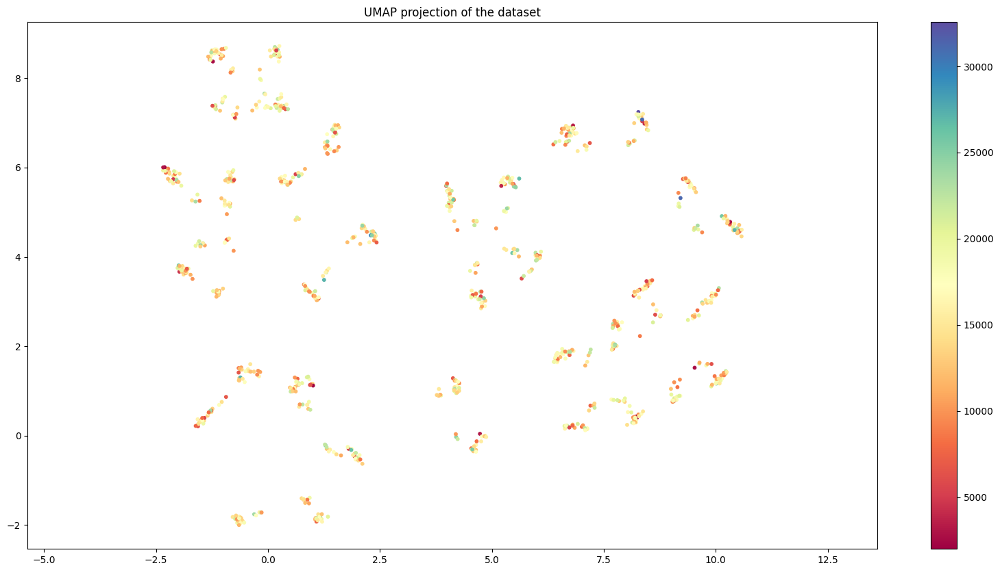

In [19]:
reducer = umap.UMAP(n_components=2)
embedding = reducer.fit_transform(X_train_scaled)
plt.figure(figsize=(20, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], c = y_train, cmap = 'Spectral', s = 10)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar()
plt.title('UMAP projection of the dataset')

plt.show()

### Inferences from the UMAP of normalized data
- The data is divided into a large number of very small clusters.
- The data is not linearly separable however there is a more noticeable separation between the clusters.
- The data is more uniformly distributed than the unscaled data.

### Linear Regression

In [20]:
# Applying linear regression model on pre-processed data

N = len(y_test)
p = X_test.shape[1]

N_train = len(y_train)
p_train = X_train.shape[1]

model = LinearRegression()  
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)
y_pred_train = model.predict(X_train_scaled)

R2 = model.score(X_test_scaled, y_test)
R2_train = model.score(X_train_scaled, y_train)

Adjusted_R2 = 1 - (1 - R2) * (N - 1) / (N - p - 1)
Adjusted_R2_train = 1 - (1 - R2_train) * (N_train - 1) / (N_train - p_train - 1)

print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train))
print('Mean Squared Error for test:', mean_squared_error(y_test, y_pred), '\n')

print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train)))
print("Root Mean Squared Error for test:", np.sqrt(mean_squared_error(y_test, y_pred)), '\n')

print('R2 Score for train:', model.score(X_train_scaled, y_train))
print('R2 Score for test:', R2, '\n')

print("Adjusted R2 Score for train:", Adjusted_R2_train)
print("Adjusted R2 Score for test:", Adjusted_R2, '\n')

print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train)))
print("Mean Absolute Error for test:", np.mean(np.abs(y_test - y_pred)), '\n')

Mean Squared Error for train: 24475013.16847547
Mean Squared Error for test: 24278016.155742623 

Root Mean Squared Error for train: 4947.222773281538
Root Mean Squared Error for test: 4927.272689403604 

R2 Score for train: 0.013922520844610209
R2 Score for test: 3.7344733075372893e-05 

Adjusted R2 Score for train: -0.0011091480449536562
Adjusted R2 Score for test: -0.0640628254763429 

Mean Absolute Error for train: 4006.3284693293604
Mean Absolute Error for test: 3842.409312558516 



### Inferences from the Linear Regression
- The large mean squared error and root mean squared error are not only because the model is unfit for our data but also because we have not scaled the label and hence the error ends up being large.
- The R2 score of 3.7344733075372893e-05 indicates that the model is not a good fit for the data. and is performing poorly.

# (d) Recursive Feature Elimination (RFE) and Correlation Analysis

### RFE

In [22]:
# Perform Recursive Feature Elimination (RFE) or Correlation analysis on the original dataset to select the 3 most important features.

rfe = RFE(model, n_features_to_select=3)

rfe.fit(X_train_scaled, y_train)

selected_features = X_train_scaled.columns[rfe.support_]
print(f"Selected Features by RFE: {selected_features}", '\n')

X_train_rfe = X_train_scaled[selected_features]
X_test_rfe = X_test_scaled[selected_features]

model.fit(X_train_rfe, y_train)

y_pred_rfe = model.predict(X_test_rfe)
y_pred_train_rfe = model.predict(X_train_rfe)

R2_rfe = model.score(X_test_rfe, y_test)
R2_train_rfe = model.score(X_train_rfe, y_train)

N = len(y_test)
p = X_test_rfe.shape[1]

N_train = len(y_train)
p_train = X_train_rfe.shape[1]

Adjusted_R2_rfe = 1 - (1 - R2_rfe) * (N - 1) / (N - p - 1)
Adjusted_R2_train_rfe = 1 - (1 - R2_train_rfe) * (N_train - 1) / (N_train - p_train - 1)

print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train_rfe))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred_rfe), '\n')

print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train_rfe)))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test, y_pred_rfe)), '\n')

print('R2 Score for train:', model.score(X_train_rfe, y_train))
print('R2 Score:', model.score(X_test_rfe, y_test), '\n')

print("Adjusted R2 Score for train:", Adjusted_R2_train_rfe)
print("Adjusted R2 Score:", Adjusted_R2_rfe, '\n')

print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train_rfe)))
print("Mean Absolute Error:", np.mean(np.abs(y_test - y_pred_rfe)), '\n')

Selected Features by RFE: Index(['Green_Certified', 'Maintenance_Resolution_Time',
       'Number_of_Residents'],
      dtype='object') 

Mean Squared Error for train: 24598921.04560434
Mean Squared Error: 23976300.350124482 

Root Mean Squared Error for train: 4959.729936761108
Root Mean Squared Error: 4896.560052743607 

R2 Score for train: 0.008930377784842514
R2 Score: 0.012464411927795571 

Adjusted R2 Score for train: 0.005945228320339058
Adjusted R2 Score: 0.00042129500008580845 

Mean Absolute Error for train: 4017.1253534034668
Mean Absolute Error: 3816.7223458373137 



### Inferences from the RFE
- The MSE has decreased by almost 301716 units and the R2 score has increased significantly. This indicates that RFE was successful in the selecting the three most important features for the model.

In [46]:
X_train_rfe

,Green_Certified,Maintenance_Resolution_Time,Number_of_Residents
0,0.0,0.009899,0.931590
1,0.0,0.011183,0.162978
2,1.0,0.032088,0.659960
3,1.0,0.098298,0.768612
4,1.0,0.029140,0.074447
...,...,...,...
995,0.0,0.052232,0.096579
996,0.0,0.189633,0.653924
997,1.0,1.000000,0.309859
998,0.0,0.045982,0.140845


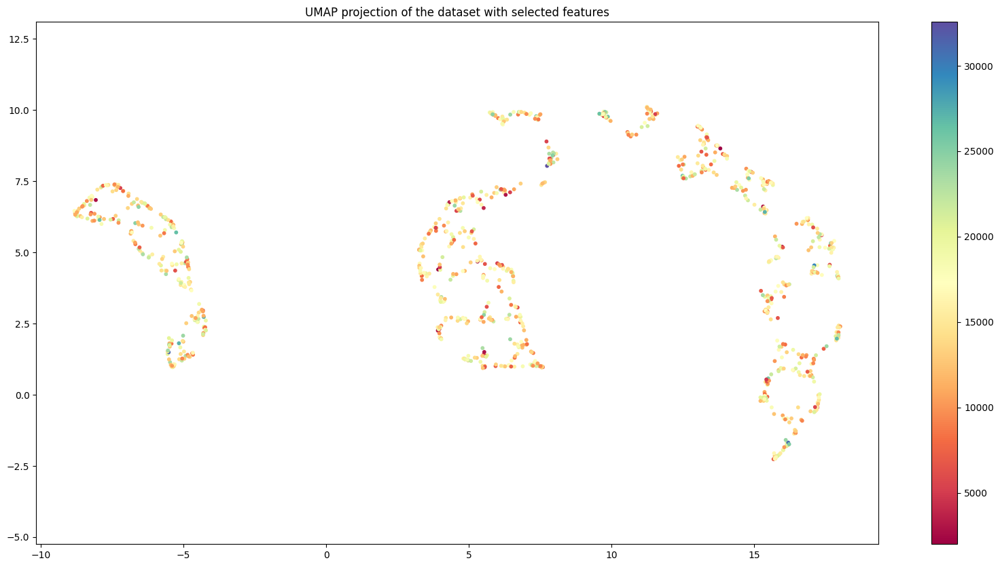

In [47]:
# UMAP projection of the dataset with selected features

reducer = umap.UMAP(n_components=2)
embedding = reducer.fit_transform(X_train_rfe)

plt.figure(figsize=(20, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], c = y_train, cmap = 'Spectral', s = 10)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar()
plt.title('UMAP projection of the dataset with selected features')

plt.show()

The UMAP plot shows distribution of data in approximately three clusters due to our feature selection using RFE.

### Correlation Analysis

In [24]:
corr_matrix = data_frame_scaled.corr()

corr_matrix['Electricity_Bill'].sort_values(ascending=False)

selected_features_corr = corr_matrix['Electricity_Bill'].sort_values(ascending=False).index[1:4]

X_train_corr = X_train_scaled[selected_features_corr]
X_test_corr = X_test_scaled[selected_features_corr]

model.fit(X_train_corr, y_train)

y_pred_corr = model.predict(X_test_corr)
y_pred_train_corr = model.predict(X_train_corr)

R2_corr = model.score(X_test_corr, y_test)
R2_train_corr = model.score(X_train_corr, y_train)

N = len(y_test)
p = X_test_corr.shape[1]

N_train = len(y_train)
p_train = X_train_corr.shape[1]

Adjusted_R2_corr = 1 - (1 - R2_corr) * (N - 1) / (N - p - 1)
Adjusted_R2_train_corr = 1 - (1 - R2_train_corr) * (N_train - 1) / (N_train - p_train - 1)

print("Features selected by correlation analysis: ", selected_features_corr, '\n')

print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train_corr))
print('Mean Squared Error for test:', mean_squared_error(y_test, y_pred_corr), '\n')

print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train_corr)))
print("Root Mean Squared Error for test:", np.sqrt(mean_squared_error(y_test, y_pred_corr)), '\n')

print('R2 Score for train:', model.score(X_train_corr, y_train))
print('R2 Score for test:', model.score(X_test_corr, y_test), '\n')

print("Adjusted R2 Score for train:", Adjusted_R2_train_corr)
print("Adjusted R2 Score for test:", Adjusted_R2_corr, '\n')

print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train_corr)))
print("Mean Absolute Error for test:", np.mean(np.abs(y_test - y_pred_corr)), '\n')

Features selected by correlation analysis:  Index(['Number_of_Residents', 'Occupancy_Rate', 'Building_Status'], dtype='object') 

Mean Squared Error for train: 24695588.591842424
Mean Squared Error for test: 24218279.313990254 

Root Mean Squared Error for train: 4969.46562437476
Root Mean Squared Error for test: 4921.207099278617 

R2 Score for train: 0.005035724505008332
R2 Score for test: 0.0024977850966028114 

Adjusted R2 Score for train: 0.002038844157131847
Adjusted R2 Score for test: -0.00966687606075567 

Mean Absolute Error for train: 4011.4533029079444
Mean Absolute Error for test: 3823.7875391944817 



### Inferences from the Correlation Analysis
Similar to RFE, the correlation analysis method also improved the model performance, although not as significantly as RFE, indicating RFE was more effective in selecting the most important features.

In [49]:
X_train_corr

,Number_of_Residents,Occupancy_Rate,Building_Status
0,0.931590,0.761137,1
1,0.162978,0.521143,1
2,0.659960,0.881262,2
3,0.768612,0.686595,2
4,0.074447,0.508822,2
...,...,...,...
995,0.096579,0.953991,1
996,0.653924,0.540006,1
997,0.309859,0.390989,1
998,0.140845,0.951936,0


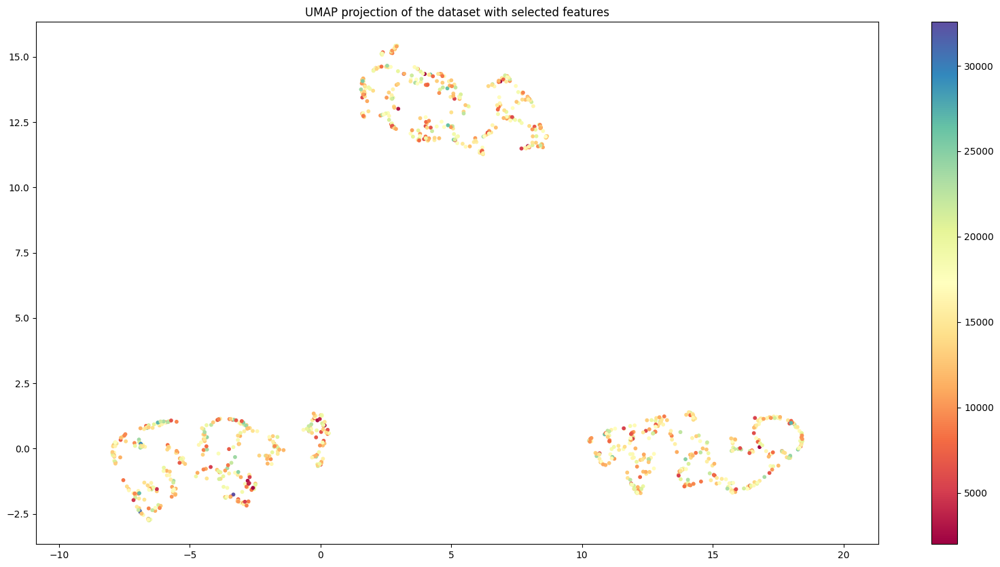

In [48]:
# UMAP projection of the dataset with selected features

reducer = umap.UMAP(n_components=2)
embedding = reducer.fit_transform(X_train_corr)

plt.figure(figsize=(20, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], c = y_train, cmap = 'Spectral', s = 10)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar()
plt.title('UMAP projection of the dataset with selected features')

plt.show()

The UMAP shows a huge improvement in the separability of the three clusters after feature selection using correlation analysis.

# (e) One Hot Encoding and applying Ridge Regression

### One Hot Encoding

In [26]:
# One-hot encoding categorical features
X_train_cat_encoded = pd.get_dummies(X_train_cat).reset_index(drop=True)
X_test_cat_encoded = pd.get_dummies(X_test_cat).reset_index(drop=True)

# Ensure that both train and test sets have the same columns after one-hot encoding
X_train_cat_encoded, X_test_cat_encoded = X_train_cat_encoded.align(X_test_cat_encoded, join='left', axis=1, fill_value=0)

# Concatenate the scaled numerical features with the one-hot encoded categorical features
X_train_scaled_hot = pd.concat([X_train_scaled_num, X_train_cat_encoded], axis=1)
X_test_scaled_hot = pd.concat([X_test_scaled_num, X_test_cat_encoded], axis=1)

In [28]:
X_train_cat_encoded

,Building_Type_Commercial,Building_Type_Industrial,Building_Type_Institutional,Building_Type_Residential,Building_Status_Closed,Building_Status_Operational,Building_Status_Under Maintenance,Maintenance_Priority_High,Maintenance_Priority_Low,Maintenance_Priority_Medium
0,False,False,False,True,False,True,False,False,True,False
1,False,False,True,False,False,True,False,False,True,False
2,False,False,True,False,False,False,True,False,True,False
3,False,False,False,True,False,False,True,False,False,True
4,True,False,False,False,False,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...
995,True,False,False,False,False,True,False,False,False,True
996,True,False,False,False,False,True,False,False,True,False
997,True,False,False,False,False,True,False,True,False,False
998,False,True,False,False,True,False,False,True,False,False


In [29]:
X_train_scaled_hot

,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,...,Building_Type_Commercial,Building_Type_Industrial,Building_Type_Institutional,Building_Type_Residential,Building_Status_Closed,Building_Status_Operational,Building_Status_Under Maintenance,Maintenance_Priority_High,Maintenance_Priority_Low,Maintenance_Priority_Medium
0,0.452830,0.916667,0.000000,0.292775,0.527471,0.761137,0.060281,0.222222,0.0,0.009899,...,False,False,False,True,False,True,False,False,True,False
1,0.264151,1.000000,0.000000,0.592331,0.179643,0.521143,0.019143,0.111111,0.0,0.011183,...,False,False,True,False,False,True,False,False,True,False
2,0.660377,0.250000,0.000000,1.000000,0.448951,0.881262,0.087181,0.333333,1.0,0.032088,...,False,False,True,False,False,False,True,False,True,False
3,0.075472,0.000000,0.000000,0.761133,0.133901,0.686595,0.482759,0.111111,1.0,0.098298,...,False,False,False,True,False,False,True,False,False,True
4,0.264151,0.833333,1.000000,0.030058,0.182934,0.508822,0.081170,0.333333,1.0,0.029140,...,True,False,False,False,False,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.886792,1.000000,1.000000,0.000000,0.199818,0.953991,0.015541,0.222222,0.0,0.052232,...,True,False,False,False,False,True,False,False,False,True
996,0.811321,0.416667,0.000000,0.695651,0.056182,0.540006,0.488115,0.166667,0.0,0.189633,...,True,False,False,False,False,True,False,False,True,False
997,0.301887,0.833333,0.713942,1.000000,0.235340,0.390989,0.504950,0.166667,1.0,1.000000,...,True,False,False,False,False,True,False,True,False,False
998,0.849057,0.083333,0.870502,0.000000,0.554045,0.951936,0.689924,0.166667,0.0,0.045982,...,False,True,False,False,True,False,False,True,False,False


In [30]:
X_test_scaled_hot

,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,...,Building_Type_Commercial,Building_Type_Industrial,Building_Type_Institutional,Building_Type_Residential,Building_Status_Closed,Building_Status_Operational,Building_Status_Under Maintenance,Maintenance_Priority_High,Maintenance_Priority_Low,Maintenance_Priority_Medium
0,0.396226,0.000000,1.000000,0.513432,0.375453,0.427499,0.868908,0.333333,0.0,0.064824,...,False,False,False,True,True,False,False,False,True,False
1,0.528302,0.750000,1.000000,0.575561,0.119421,0.650795,0.020869,0.444444,1.0,0.076199,...,False,False,True,False,False,True,False,True,False,False
2,0.698113,0.750000,0.000000,0.000000,0.201439,0.960403,0.717138,0.000000,1.0,0.046338,...,False,True,False,False,False,False,True,True,False,False
3,0.490566,0.416667,0.000000,0.126377,0.174001,0.259173,0.366902,0.333333,0.0,0.009398,...,False,True,False,False,False,True,False,False,False,True
4,0.905660,0.583333,0.000000,0.077579,0.162230,0.915807,0.502659,0.055556,1.0,0.303808,...,True,False,False,False,False,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,0.132075,0.833333,0.121775,0.098468,0.474374,0.842799,0.013730,0.000000,0.0,0.223344,...,False,True,False,False,False,False,True,False,False,True
246,0.000000,0.666667,1.000000,0.637025,0.401858,0.677896,0.021664,0.722222,0.0,0.045839,...,False,True,False,False,True,False,False,False,True,False
247,0.113208,1.000000,1.000000,0.697109,0.395601,0.892294,0.230688,0.000000,1.0,0.139876,...,False,False,False,True,False,False,True,True,False,False
248,0.679245,0.833333,0.136560,0.089000,0.246371,0.718838,0.836247,0.166667,0.0,0.062552,...,False,False,True,False,False,True,False,True,False,False


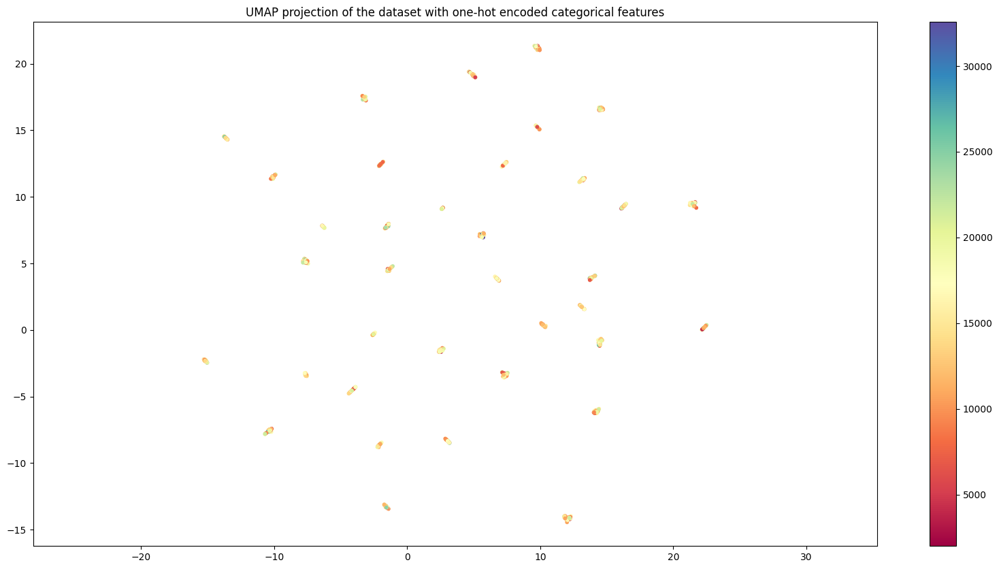

In [50]:
# UMAP projection of the dataset with one-hot encoded categorical features

reducer = umap.UMAP(n_components=2)
embedding = reducer.fit_transform(X_train_scaled_hot)

plt.figure(figsize=(20, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], c = y_train, cmap = 'Spectral', s = 10)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar()
plt.title('UMAP projection of the dataset with one-hot encoded categorical features')

plt.show()

The UMAP plot shows clear distinction between various small clusters indicating that one hot encoding has improved the separability of the data.

### Ridge Regression

In [31]:
# Applying ridge regression model on pre-processed data

model = Ridge(alpha=0.05)

model.fit(X_train_scaled_hot, y_train)

y_pred = model.predict(X_test_scaled_hot)
y_pred_train = model.predict(X_train_scaled_hot)

R2 = model.score(X_test_scaled_hot, y_test)
R2_train = model.score(X_train_scaled_hot, y_train)

N = len(y_test)
p = X_test_scaled_hot.shape[1]

N_train = len(y_train)
p_train = X_train_scaled_hot.shape[1]

Adjusted_R2 = 1 - (1 - R2) * (N - 1) / (N - p - 1)
Adjusted_R2_train = 1 - (1 - R2_train) * (N_train - 1) / (N_train - p_train - 1)

print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train))
print('Mean Squared Error for test:', mean_squared_error(y_test, y_pred), '\n')

print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train)))
print("Root Mean Squared Error for test:", np.sqrt(mean_squared_error(y_test, y_pred)), '\n')

print('R2 Score for train:', model.score(X_train_scaled_hot, y_train))
print('R2 Score for test:', R2, '\n')

print("Adjusted R2 Score for train:", Adjusted_R2_train)
print("Adjusted R2 Score for test:", Adjusted_R2, '\n')

print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train)))
print("Mean Absolute Error for test:", np.mean(np.abs(y_test - y_pred)), '\n')

Mean Squared Error for train: 24188925.944940828
Mean Squared Error for test: 24129699.306866154 

Root Mean Squared Error for train: 4918.223860799834
Root Mean Squared Error for test: 4912.199029647125 

R2 Score for train: 0.0254487319342519
R2 Score for test: 0.006146217429753964 

Adjusted R2 Score for train: 0.003503872264398855
Adjusted R2 Score for test: -0.09017441348013766 

Mean Absolute Error for train: 3976.6864225405034
Mean Absolute Error for test: 3797.4489513870913 



### Inferences from the Ridge Regression on the One Hot Encoded data
- R2 score has seen a huge jump from 0.000037 which we obtaine dby applying linear regression on the unscaled data to 0.006.

These predictions indicate that ridge regression has done a better job at predicting the target value than logistic regression. These values are also better than regression after appyling recursive feature elimination. This implies that Ridge Regression has implemented regularization, but its effectiveness in improving model performance is limited as RMSE, MSE have improved but still the values as in are large and low R^2 score although it has a large jump. This again leads us to conclude that the model is not a good fit for the data as data is not linearly separable and needs a more complex model to predict the target value.

In [32]:
X_train_scaled

,Construction_Year,Number_of_Floors,Energy_Consumption_Per_SqM,Water_Usage_Per_Building,Waste_Recycled_Percentage,Occupancy_Rate,Indoor_Air_Quality,Smart_Devices_Count,Green_Certified,Maintenance_Resolution_Time,Energy_Per_SqM,Number_of_Residents,Building_Type,Building_Status,Maintenance_Priority
0,0.452830,0.916667,0.000000,0.292775,0.527471,0.761137,0.060281,0.222222,0.0,0.009899,0.086227,0.931590,3,1,1
1,0.264151,1.000000,0.000000,0.592331,0.179643,0.521143,0.019143,0.111111,0.0,0.011183,0.470142,0.162978,2,1,1
2,0.660377,0.250000,0.000000,1.000000,0.448951,0.881262,0.087181,0.333333,1.0,0.032088,0.370969,0.659960,2,2,1
3,0.075472,0.000000,0.000000,0.761133,0.133901,0.686595,0.482759,0.111111,1.0,0.098298,0.687705,0.768612,3,2,2
4,0.264151,0.833333,1.000000,0.030058,0.182934,0.508822,0.081170,0.333333,1.0,0.029140,0.822250,0.074447,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.886792,1.000000,1.000000,0.000000,0.199818,0.953991,0.015541,0.222222,0.0,0.052232,0.387141,0.096579,0,1,2
996,0.811321,0.416667,0.000000,0.695651,0.056182,0.540006,0.488115,0.166667,0.0,0.189633,0.406613,0.653924,0,1,1
997,0.301887,0.833333,0.713942,1.000000,0.235340,0.390989,0.504950,0.166667,1.0,1.000000,0.491795,0.309859,0,1,0
998,0.849057,0.083333,0.870502,0.000000,0.554045,0.951936,0.689924,0.166667,0.0,0.045982,0.466704,0.140845,1,0,0


# (f) Independent Component Analysis (ICA)

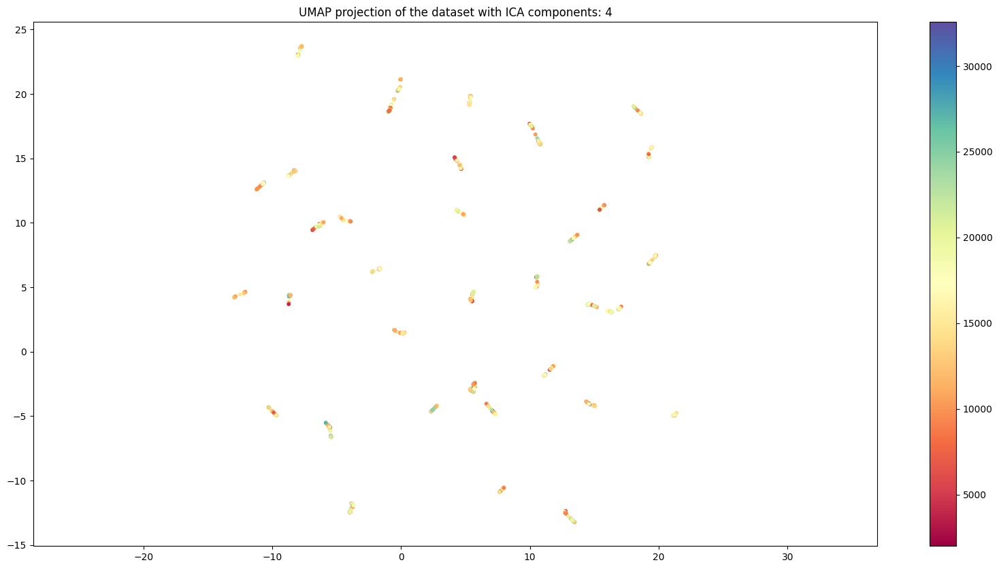

number of components:  4 

Mean Squared Error for train: 24723510.292957045
Mean Squared Error for test: 24639889.43607532 

Root Mean Squared Error for train: 4972.274157059026
Root Mean Squared Error for test: 4963.858321515162 

R2 Score for train: 0.003910782897855292
R2 Score for test: -0.014867487850868777 

Adjusted R2 Score for train: -9.359586436441525e-05
Adjusted R2 Score for test: -0.031436752958638126 

Mean Absolute Error for train: 3999.4510999309614
Mean Absolute Error for test: 3854.3454182518394 



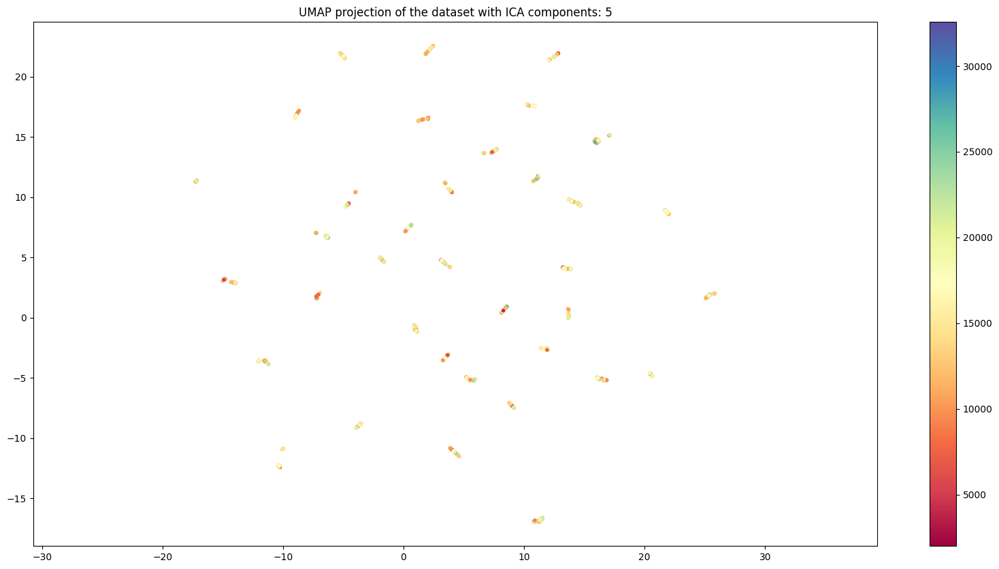

number of components:  5 

Mean Squared Error for train: 24680440.647721324
Mean Squared Error for test: 24698036.226428285 

Root Mean Squared Error for train: 4967.941288674951
Root Mean Squared Error for test: 4969.711885655775 

R2 Score for train: 0.005646022299354736
R2 Score for test: -0.017262437195312952 

Adjusted R2 Score for train: 0.0006442417274198364
Adjusted R2 Score for test: -0.0381079789411185 

Mean Absolute Error for train: 3993.727088053057
Mean Absolute Error for test: 3839.755733501596 



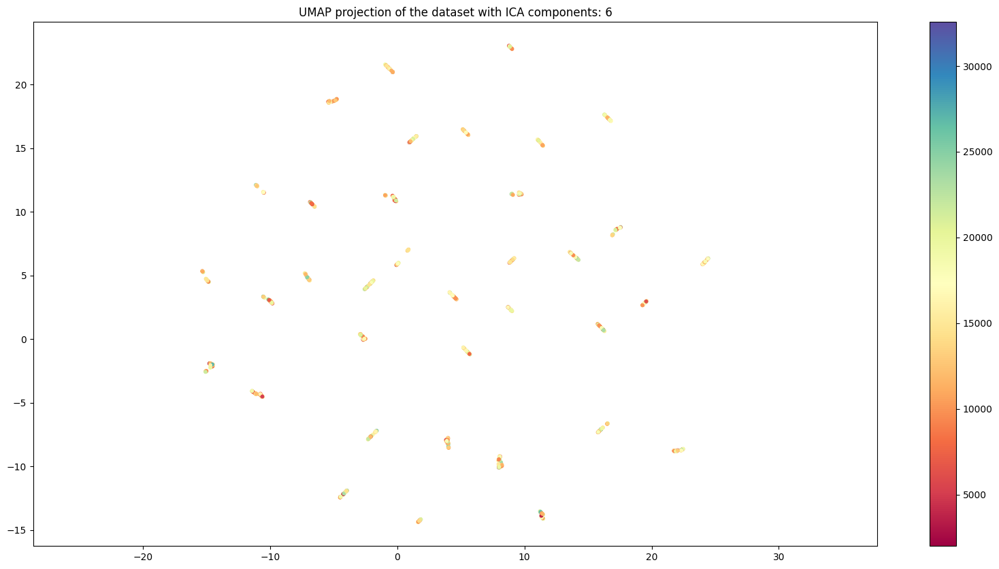

number of components:  6 

Mean Squared Error for train: 24616634.383210227
Mean Squared Error for test: 24493735.346131023 

Root Mean Squared Error for train: 4961.5153313489045
Root Mean Squared Error for test: 4949.114602242609 

R2 Score for train: 0.008216722467331072
R2 Score for test: -0.008847694844665854 

Adjusted R2 Score for train: 0.0022240742647167133
Adjusted R2 Score for test: -0.03375751447046005 

Mean Absolute Error for train: 3986.3770717768302
Mean Absolute Error for test: 3823.865663480825 



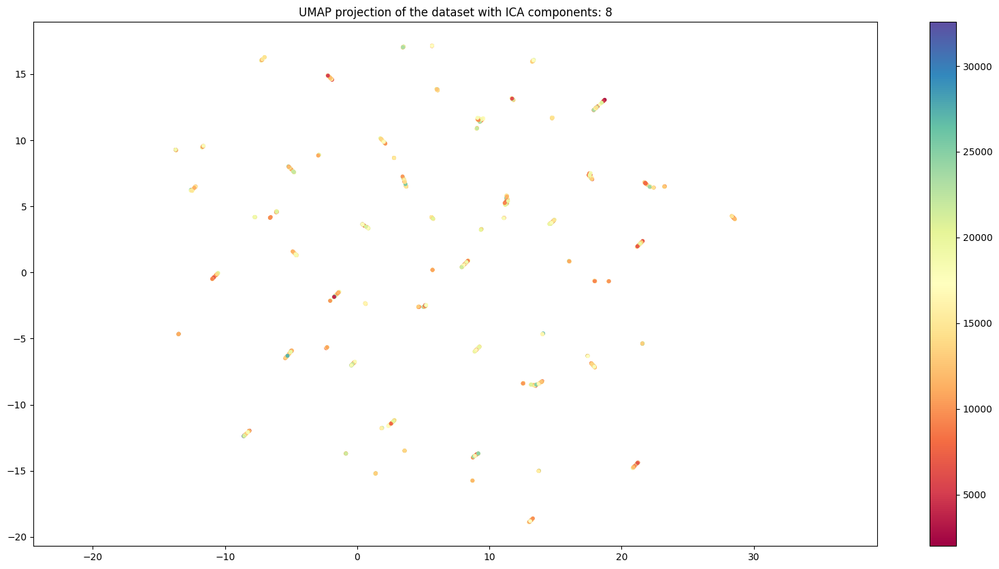

number of components:  8 

Mean Squared Error for train: 24414626.128019493
Mean Squared Error for test: 24074349.40562409 

Root Mean Squared Error for train: 4941.115878829345
Root Mean Squared Error for test: 4906.561872189537 

R2 Score for train: 0.0163554633814168
R2 Score for test: 0.008425968537081663 

Adjusted R2 Score for train: 0.008414841491458547
Adjusted R2 Score for test: -0.024489352009405163 

Mean Absolute Error for train: 3978.83358502663
Mean Absolute Error for test: 3781.746734661708 



In [51]:
# Independent Component Analysis (ICA)
from sklearn.decomposition import FastICA

components = [4, 5, 6, 8]

for component in components:
    ica = FastICA(n_components=component)
    X_train_ica = ica.fit_transform(X_train_scaled_hot)

    # UMAP projection of the dataset with ICA components
    reducer = umap.UMAP(n_components=2)
    embedding = reducer.fit_transform(X_train_ica)

    plt.figure(figsize=(20, 10))
    plt.scatter(embedding[:, 0], embedding[:, 1], c = y_train, cmap = 'Spectral', s = 10)
    plt.gca().set_aspect('equal', 'datalim')    
    plt.colorbar()
    plt.title('UMAP projection of the dataset with ICA components: ' + str(component))

    plt.show()

    X_test_ica = ica.transform(X_test_scaled_hot)

    model = LinearRegression()

    model.fit(X_train_ica, y_train)

    y_pred = model.predict(X_test_ica)
    y_pred_train = model.predict(X_train_ica)

    R2 = model.score(X_test_ica, y_test)
    R2_train = model.score(X_train_ica, y_train)

    N = len(y_test)
    p = X_test_ica.shape[1]

    N_train = len(y_train)
    p_train = X_train_ica.shape[1]

    Adjusted_R2 = 1 - (1 - R2) * (N - 1) / (N - p - 1)
    Adjusted_R2_train = 1 - (1 - R2_train) * (N_train - 1) / (N_train - p_train - 1)

    print("number of components: ", component, '\n')

    print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train))
    print('Mean Squared Error for test:', mean_squared_error(y_test, y_pred), '\n')

    print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train)))
    print("Root Mean Squared Error for test:", np.sqrt(mean_squared_error(y_test, y_pred)), '\n')

    print('R2 Score for train:', model.score(X_train_ica, y_train))
    print('R2 Score for test:', R2, '\n')

    print("Adjusted R2 Score for train:", Adjusted_R2_train)
    print("Adjusted R2 Score for test:", Adjusted_R2, '\n')

    print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train)))
    print("Mean Absolute Error for test:", np.mean(np.abs(y_test - y_pred)), '\n')



Independent Component Analysis (ICA) is a dimensionality reduction technique that is used to separate a multivariate signal into additive, independent components. It is used to separate the data into independent components.
### Inferences from applying ICA
- The UMAP plot shows a clear separation between the clusters, indicating that ICA has done a good job in separating the data into independent components.
- We see that R2 score decreases from 4 to 5 components but then increases againa and is the best for 8 components on testing data but continues to increase and shows significant jump for the 8th component on the training data. MSE and RMSE similarly show a decreasing trend with increasing number of components, although not significant.

# (g) ElasticNet Regularization

In [36]:
# elastic net regularisation

alphas = [0.01, 0.05, 0.1, 0.5, 0.9, 1]

for alpha in alphas:
    model = ElasticNet(alpha, l1_ratio=0.5, random_state=42) 

    model.fit(X_train_scaled, y_train)

    y_pred = model.predict(X_test_scaled)
    y_pred_train = model.predict(X_train_scaled)

    R2 = model.score(X_test_scaled, y_test)
    R2_train = model.score(X_train_scaled, y_train)

    N = len(y_test)
    p = X_test_scaled.shape[1]

    N_train = len(y_train)
    p_train = X_train_scaled.shape[1]

    Adjusted_R2 = 1 - (1 - R2) * (N - 1) / (N - p - 1)
    Adjusted_R2_train = 1 - (1 - R2_train) * (N_train - 1) / (N_train - p_train - 1)

    print("alpha: ", alpha, '\n')

    print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train))
    print('Mean Squared Error for test:', mean_squared_error(y_test, y_pred), '\n')

    print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train)))
    print("Root Mean Squared Error for test:", np.sqrt(mean_squared_error(y_test, y_pred)), '\n')

    print('R2 Score for train:', R2_train)
    print('R2 Score for test:', R2, '\n')

    print("Adjusted R2 Score for train:", Adjusted_R2_train)
    print("Adjusted R2 Score for test:", Adjusted_R2, '\n')

    print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train)))
    print("Mean Absolute Error for test:", np.mean(np.abs(y_test - y_pred)), '\n')

alpha:  0.01 

Mean Squared Error for train: 24478354.282398853
Mean Squared Error for test: 24248856.228290282 

Root Mean Squared Error for train: 4947.560437468031
Root Mean Squared Error for test: 4924.312767106724 

R2 Score for train: 0.013787910204262066
R2 Score for test: 0.0012383834956982698 

Adjusted R2 Score for train: -0.0012458106767705424
Adjusted R2 Score for test: -0.06278479704944928 

Mean Absolute Error for train: 4005.271158292777
Mean Absolute Error for test: 3839.381624747574 

alpha:  0.05 

Mean Squared Error for train: 24499905.695838828
Mean Squared Error for test: 24210445.784630973 

Root Mean Squared Error for train: 4949.737942137829
Root Mean Squared Error for test: 4920.411139796244 

R2 Score for train: 0.012919622073389925
R2 Score for test: 0.00282043241539387 

Adjusted R2 Score for train: -0.0021273349071986303
Adjusted R2 Score for test: -0.061101334737465374 

Mean Absolute Error for train: 4001.9996932398735
Mean Absolute Error for test: 3835.0

### Inferences from applying ElasticNet Regularization
- As the value of alpha increases from 0.001 to 0.1 we see an increase in the R2 score but then it starts decreasing again and shows a significant drop at 1.0.
- We also see that R2 score for training data keeps on decreasing with increasing alpha values. This suggests that imposin higher penalty on the model is not a good idea as it leads to underfitting of the model.

Note: Our L1 ratio is 0.5 which means that we are using a combination of L1 and L2 regularization.

# (h) Gradient Boosting Regression

In [37]:
# Gradient Boosting Regressor

model = GradientBoostingRegressor(n_estimators=5000, learning_rate=0.1, random_state=42)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)
y_pred_train = model.predict(X_train_scaled)

R2 = model.score(X_test_scaled, y_test)
R2_train = model.score(X_train_scaled, y_train)

N = len(y_test)
p = X_test_scaled.shape[1]

N_train = len(y_train)
p_train = X_train_scaled.shape[1]

Adjusted_R2 = 1 - (1 - R2) * (N - 1) / (N - p - 1)
Adjusted_R2_train = 1 - (1 - R2_train) * (N_train - 1) / (N_train - p_train - 1)

print("Iterations: ", 5000, "learning rate: ", 0.1, '\n')

print('Mean Squared Error for train:', mean_squared_error(y_train, y_pred_train))
print('Mean Squared Error for test:', mean_squared_error(y_test, y_pred), '\n')

print("Root Mean Squared Error for train:", np.sqrt(mean_squared_error(y_train, y_pred_train)))
print("Root Mean Squared Error for test:", np.sqrt(mean_squared_error(y_test, y_pred)), '\n')

print('R2 Score for train:', R2_train)
print('R2 Score for test:', R2, '\n')

print("Adjusted R2 Score for train:", Adjusted_R2_train)
print("Adjusted R2 Score for test:", Adjusted_R2, '\n')

print("Mean Absolute Error for train:", np.mean(np.abs(y_train - y_pred_train)))
print("Mean Absolute Error for test:", np.mean(np.abs(y_test - y_pred)), '\n')

Iterations:  5000 learning rate:  0.1 

Mean Squared Error for train: 7.248172357591522
Mean Squared Error for test: 28777559.87192035 

Root Mean Squared Error for train: 2.692242997500694
Root Mean Squared Error for test: 5364.472003088501 

R2 Score for train: 0.999999707977296
R2 Score for test: -0.18528981103844022 

Adjusted R2 Score for train: 0.9999997035257304
Adjusted R2 Score for test: -0.261269927130648 

Mean Absolute Error for train: 2.1096410858446415
Mean Absolute Error for test: 4232.535371799777 



### Inferences from applying Gradient Boosting Regression
- On training data we see hugely significant improvement in metrics as the R2 score comes close to 1 and MSE and RMSE are very low. This suggests that the model is trained very well on the training data.
- However, on testing data we see that the R2 score is very low and MSE and RMSE are very high. This suggests that the model is overfitting on the training data and is not able to generalize well on the testing data.

- As compared to ElasticNet Regularization, Gradient Boosting Regression has performed better on the training data but has not been able to generalize well on the testing data. Hence, ElasticNet Regularization is better when it comes to generalizing on unseen data but Gradient Boosting Regression is better at training on the training data.